In [1]:
import requests
from PIL import Image

In [2]:
subscription_key = 'c5017c1f184d4d71849be3597abbc8bf'

In [3]:
assert subscription_key

In [4]:
face_api_url = 'https://20201213mt.cognitiveservices.azure.com/face/v1.0/detect'

In [52]:
img = Image.open('IMG_5856.JPG')

In [53]:
with open('IMG_5856.JPG', 'rb') as f:
    binary_img = f.read()

In [54]:
#binary_img

In [55]:
headers = {
    'Content-Type':'application/octet-stream',
    'Ocp-Apim-Subscription-Key': subscription_key
}

params = {
    'returnFaceId': 'true',
    'returnfaceAttributes' : 'age, gender, smile, facialHair, headPose, glasses, emotion, hair, makeup, accessories, blur, exposure, noise'
}

res = requests.post(face_api_url, params=params, headers=headers, data=binary_img)

In [56]:
res

<Response [200]>

In [57]:
result = res.json()
result

[{'faceId': '4dba0581-5d7d-41d1-9fd3-5f542b1b7037',
  'faceRectangle': {'top': 1058, 'left': 2108, 'width': 208, 'height': 208},
  'faceAttributes': {'smile': 1.0,
   'headPose': {'pitch': -1.5, 'roll': -3.4, 'yaw': -2.1},
   'gender': 'female',
   'age': 31.0,
   'facialHair': {'moustache': 0.0, 'beard': 0.0, 'sideburns': 0.0},
   'glasses': 'NoGlasses',
   'emotion': {'anger': 0.0,
    'contempt': 0.0,
    'disgust': 0.0,
    'fear': 0.0,
    'happiness': 1.0,
    'neutral': 0.0,
    'sadness': 0.0,
    'surprise': 0.0},
   'blur': {'blurLevel': 'low', 'value': 0.1},
   'exposure': {'exposureLevel': 'goodExposure', 'value': 0.57},
   'noise': {'noiseLevel': 'medium', 'value': 0.39},
   'makeup': {'eyeMakeup': True, 'lipMakeup': True},
   'accessories': [],
   'hair': {'bald': 0.04,
    'invisible': False,
    'hairColor': [{'color': 'brown', 'confidence': 1.0},
     {'color': 'black', 'confidence': 0.99},
     {'color': 'gray', 'confidence': 0.12},
     {'color': 'red', 'confidence':

In [58]:
rect = result[0]['faceRectangle']
rect

{'top': 1058, 'left': 2108, 'width': 208, 'height': 208}

In [59]:
from PIL import ImageDraw

In [60]:
draw = ImageDraw.Draw(img)

In [61]:
draw.rectangle([(rect['left'],rect['top']), (rect['left'] + rect['height'], rect['top']+rect['width'])],
               fill=None, outline='green', width=5)

In [62]:
age = result[0]['faceAttributes']['age']
age

31.0

In [63]:
gender = result[0]['faceAttributes']['gender']
gender

'female'

In [64]:
label = f'{gender} : {age}'
label

'female : 31.0'

In [65]:
from PIL import ImageFont

In [66]:
font = ImageFont.truetype("meiryob.ttc", size=60)
draw.text((rect['left'], rect['top']-70), text = label, font = font, fill = 'white')

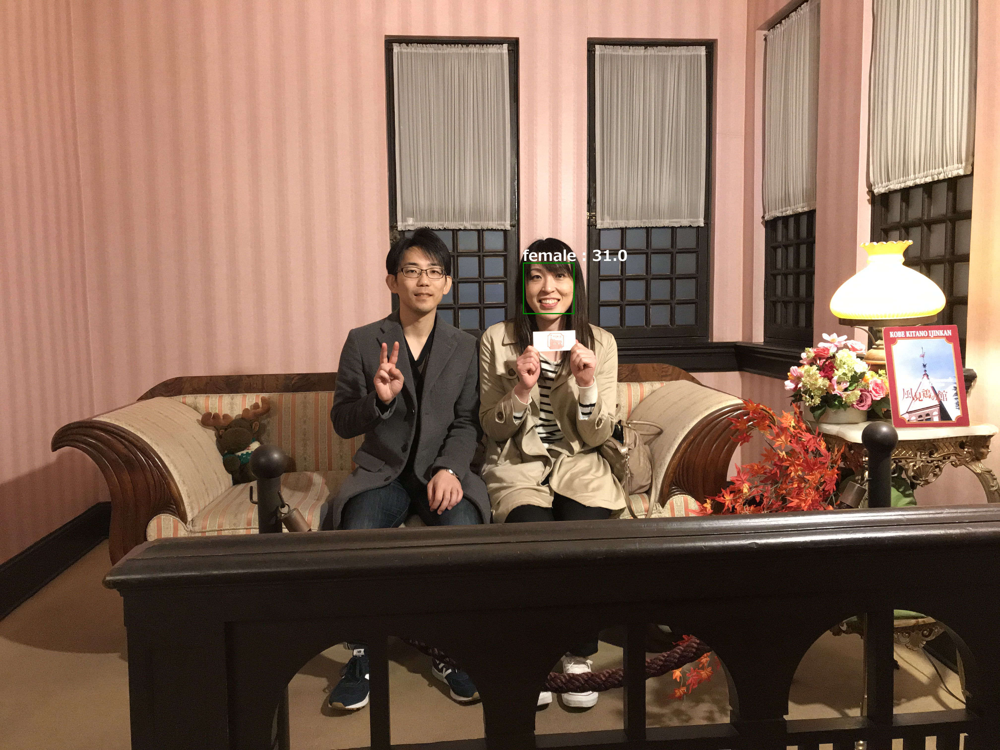

In [67]:
img

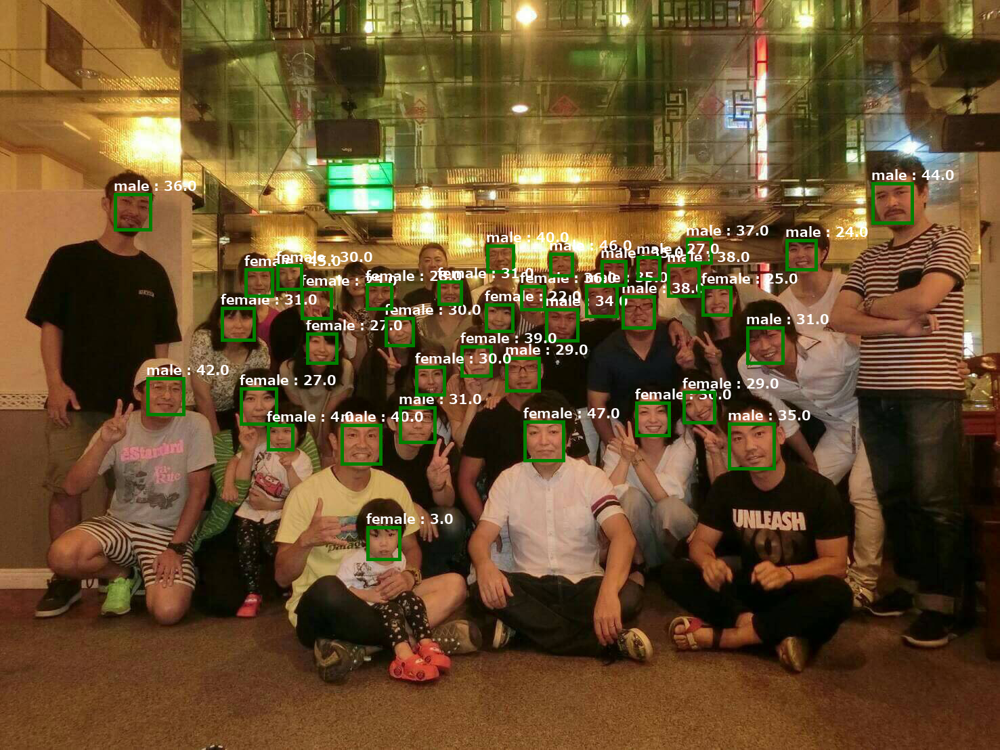

In [73]:
import io
import requests
from PIL import Image, ImageDraw, ImageFont

subscription_key = 'c5017c1f184d4d71849be3597abbc8bf'
assert subscription_key

face_api_url = 'https://20201213mt.cognitiveservices.azure.com/face/v1.0/detect'

img = Image.open('IMG_0271.JPG')
with io.BytesIO() as output:
    img.save(output, format='JPEG')
    binary_img = output.getvalue()

headers = {
    'Content-Type':'application/octet-stream',
    'Ocp-Apim-Subscription-Key': subscription_key
}

params = {
    'returnFaceId': 'true',
    'returnfaceAttributes' : 'age, gender, smile, facialHair, headPose, glasses, emotion, hair, makeup, accessories, blur, exposure, noise'
}

res = requests.post(face_api_url, params=params, headers=headers, data=binary_img)

results = res.json()
for result in results:
    rect = result['faceRectangle']
    age = result['faceAttributes']['age']
    gender = result['faceAttributes']['gender']
    label = f'{gender} : {age}'
    
    draw = ImageDraw.Draw(img)
    draw.rectangle([(rect['left'], rect['top']), (rect['left'] + rect['height'], rect['top'] + rect['width'])],
                   fill=None, outline='green', width=5)
    
    font = ImageFont.truetype("meiryob.ttc", size=20)
    draw.text((rect['left'], rect['top']-25), text = label, font = font, fill = 'white')
img


In [69]:
import io

In [ ]:
with io.BytesIO() as output:
    img.save(output, format='JPEG')
    binary_img = output.getvalue()